<a href="https://colab.research.google.com/github/ijenims/Materials/blob/main/FFT_colab_r09.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 高次振動法によるケーブル張力測定 r.09

- 2024.7.21 r.08（暫定完成版）より引き継ぎ
-

# バックエンド

## ライブラリのインポート

### Google Colab用

#### ライブラリのインストール

#### ドライブのマウント

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### インポート

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from datetime import datetime
import csv

from typing import List, Tuple, Dict, Any, Optional    # 型ヒント

from scipy.signal import find_peaks    # ピークサーチ
#from scipy.signal import argrelmin    # 最小値
from scipy.optimize import minimize    # 最小化
import soundfile as sf

# import japanize_matplotlib

import ipywidgets as widgets
from IPython.display import display, HTML

## クラスの定義

### DirectoryFileLister:<br> 指定したフォルダ内のファイルを一覧するクラス

In [ ]:
class DirectoryFileLister:
    """
    This class provides functionality to list files in a specified directory,
    including their names, modification dates, and sizes. The file list can
    be displayed as a pandas DataFrame.
    """
    def __init__(self, directory_path: str):
        self.directory_path: str = directory_path
        self.file_list: List[Dict[str, Any]] = self._get_file_list()

    def _get_file_list(self) -> List[Dict[str, Any]]:
        try:
            files: List[Dict[str, Any]] = []
            with os.scandir(self.directory_path) as entries:
                for entry in entries:
                    if entry.is_file():
                        info = entry.stat()
                        files.append({
                            'File Name': entry.name,
                            'Modification Date': datetime.fromtimestamp(info.st_mtime).strftime('%Y-%m-%d %H:%M:%S'),
                            'File Size (Bytes)': info.st_size
                        })
            return files
        except FileNotFoundError:
            print(f"Directory {self.directory_path} not found.")
            return []
        except Exception as e:
            print(f"An error occurred: {e}")
            return []

    def display_file_list(self) -> None:
        df = pd.DataFrame(self.file_list)
        display(df)

    def get_file_list(self) -> List[Dict[str, Any]]:
        return self.file_list

    def get_directory_path(self) -> str:
        return self.directory_path


### GetRawData: <br>wavデータより生データのデータフレームを得るクラス

In [ ]:
class GetRawData:
    def __init__(self, wav_file_name: str):
        self.wav_file_name = wav_file_name
        self.data, self.samplerate = sf.read(self.wav_file_name)

    def get_amplitude(self) -> Tuple[pd.DataFrame, int]:
        df = pd.DataFrame(self.data)
        print(f'data.shape: {self.data.shape}')
        print(f'samplerate: {self.samplerate}')
        return df, self.samplerate

    def plot_df(self, df: pd.DataFrame, title: str) -> None:
        col_count: int = df.shape[1]
        fig, ax = plt.subplots(col_count, 1, figsize=(15, 6), sharex=True, sharey=True, tight_layout=True)
        fig.suptitle(title)

        for i, col in enumerate(df.columns):
            ax[i].plot(df[col], label = f'ch: {col}')
            ax[i].legend(loc='upper left')
            #ax[i].set_title(col)
        plt.show()

### GetNaturalFrequency: <br>固有振動数を取得するクラス

$$fi^2=\frac{\pi^2EI}{4\rho AL^4}i^4+\frac{T}{4\rho AL^2}i^2$$
$$\xi=L\sqrt{\frac{T}{EI}}$$

In [ ]:
class GetNaturalFrequency:
    """
    Get natural frequency of cable
    """
    # constants
    DENSITY: float = 7.85                    # g/cm3
    RHO: float = DENSITY * 10**6 / 10**3     # kg/m3
    YOUNGS_MODULUS: float = 196_000 * 10**6  # N/m2

    #BETA: float = 0.5  # これも収束パラメータとする

    def __init__(self, cable_name: str, unit_weight: float, cable_length: float,
                 design_tension: float, max_mode: int, beta: float = 0.5):
        self.cable_name: str = cable_name
        self.unit_weight: float = unit_weight        # kg/m
        self.cable_length: float = cable_length      # m
        self.design_tension: float = design_tension  # N
        self.max_mode: int = max_mode
        self.beta: float = beta

        self._theorical_cable_dia: float = self._calculate_theorical_cable_dia()
        self._moment_of_inertia: float = self._calculate_moment_of_inertia()
        self._flexural_rigidity: float = self._calculate_flexural_rigidity()
        self._virtual_flexural_rigidity: float = self._calculate_virtual_flexural_rigidity()

        self.xi: float = self._calculate_xi()

    def _calculate_theorical_cable_dia(self) -> float:
        return np.sqrt(self.unit_weight * 4 / (self.RHO * np.pi))

    def _calculate_moment_of_inertia(self) -> float:
        return np.pi * self._theorical_cable_dia ** 4 / 64

    def _calculate_flexural_rigidity(self) -> float:
        return self.YOUNGS_MODULUS * self._moment_of_inertia

    def _calculate_virtual_flexural_rigidity(self) -> float:
        return self._flexural_rigidity * self.beta

    def _calculate_xi(self) -> float:
        return self.cable_length * np.sqrt(
            self.design_tension / self._virtual_flexural_rigidity
            )

    def get_natural_frequency_by_T(self, k: Optional[float] = None, b: Optional[float]= None) -> List[float]:
        if k is None:
            k = 1.0
        if b is None:
            b = self.beta

        T = self.design_tension * k
        EI = self._flexural_rigidity * b
        rho_A = self.unit_weight
        L = self.cable_length

        frequency_list: List[float] = []
        for i in range(1, self.max_mode + 1):
            first_term = np.pi**2 * EI * i**4 / (4 * rho_A * L**4)
            second_term = T * i**2 / (4 * rho_A * L**2)

            fi_2 = first_term + second_term
            frequency_list.append(np.sqrt(fi_2))

        return frequency_list

### ToggleSwitches: <br>トグルスイッチを必要数表示し状態をリストとして取得するクラス

In [ ]:
# @title
# トグルスイッチを必要数表示し、それぞれの状態をリストとして取得するクラス
class ToggleSwitches:
    def __init__(self, max_mode):
        # ToggleButtonウィジェットをmax_mode個作成
        self.max_mode = max_mode
        self.toggle_buttons = [widgets.ToggleButton(
            value=True,
            description=f'{i+1}',
            disabled=False,
            button_style='',  # 'success', 'info', 'warning', 'danger'
            tooltip=f'Toggle switch {i+1}',
            icon='check'
        ) for i in range(self.max_mode)]

        # 各トグルボタンの状態が変わったときに呼び出されるコールバック関数を設定
        for button in self.toggle_buttons:
            button.observe(self.on_toggle_change, names='value')

    def on_toggle_change(self, change):
        # トグルボタンの値が変わったときにリストを更新
        self.update_status_list()

    def update_status_list(self):
        # 各トグルボタンの現在の状態をリストに保存
        self.status_list = [button.value for button in self.toggle_buttons]
        print(f"Current status list: {self.status_list}")

    def get_status_list(self):
        # 現在の状態リストを返す
        return self.status_list

    def display(self):
        # トグルボタンを水平に配置して表示
        display(widgets.HBox(self.toggle_buttons))
        # 初期状態リストの更新
        self.update_status_list()



### GetFFT:<br>FFTにより周波数成分を得る

In [ ]:
class GetFFT:    # 未確認
    """
    Get FFT of signal
    """
    def __init__(self, data, sampling_freq):
        self.data = data
        self.sampling_freq = sampling_freq

    def frequency_component(self) -> Tuple[List[float], List[float]]:
        """
        Get frequency component of signal
        """
        # FFTを実行し、周波数成分を取得
        sampling_interval = 1 / self.sampling_freq
        fft_result = np.fft.fft(self.data)
        frequencies = np.fft.fftfreq(len(self.data), d=sampling_interval)

        # 正の周波数成分のみを取得し、0 Hzを除外
        positive_frequencies = frequencies[:len(frequencies)//2]
        positive_fft_result = np.abs(fft_result)[:len(frequencies)//2]
        filtered_frequencies = positive_frequencies[positive_frequencies > 0]
        filtered_fft_result = positive_fft_result[positive_frequencies > 0]

        return filtered_frequencies, filtered_fft_result



## 関数の定義

### fft

In [ ]:
def fft(data, sampling_freq):
    # FFTを実行し、周波数成分を取得

    sampling_interval = 1 / sampling_freq
    fft_result = np.fft.fft(data)
    frequencies = np.fft.fftfreq(len(data), d=sampling_interval)

    # 正の周波数成分のみを取得し、0 Hzを除外
    positive_frequencies = frequencies[:len(frequencies)//2]
    positive_fft_result = np.abs(fft_result)[:len(frequencies)//2]
    filtered_frequencies = positive_frequencies[positive_frequencies > 0]
    filtered_fft_result = positive_fft_result[positive_frequencies > 0]

    return filtered_frequencies, filtered_fft_result

### find_peak_within_window

In [ ]:
# 窓関数を使用して特定の周波数範囲内のピークを見つける関数を定義
def find_peak_within_window(frequencies, fft_result, center_freq, window_width=1.0):
    lower_bound = center_freq - window_width
    upper_bound = center_freq + window_width
    window_indices = (frequencies >= lower_bound) & (frequencies <= upper_bound)
    window_frequencies = frequencies[window_indices]
    window_fft_result = fft_result[window_indices]
    peaks_in_window, _ = find_peaks(window_fft_result, height=max(window_fft_result)*0.1)
    if peaks_in_window.size > 0:
        max_peak_index = np.argmax(window_fft_result[peaks_in_window])
        return window_frequencies[peaks_in_window[max_peak_index]]
    else:
        return None

In [ ]:
class FindPeads:  # 作成中
    """
    Find peaks within a specified window.
    """
    def __init__(self, frequencies, fft_result, center_freq, window_width):
        self.frequencies = frequencies
        self.fft_result = fft_result
        self.center_freq = center_freq
        self.window_width = window_width

    def find_peaks(self) -> Optional[float]:
        # 窓関数を使用して特定の周波数範囲内のピークを見つける
        lower_bound = self.center_freq - self.window_width
        upper_bound = self.center_freq + self.window_width
        window_indices = (self.frequencies >= lower_bound) & (self.frequencies <= upper_bound)
        window_frequencies = self.frequencies[window_indices]
        window_fft_result = self.fft_result[window_indices]
        peaks_in_window, _ = find_peaks(window_fft_result, height=max(window_fft_result)*0.1)
        if peaks_in_window.size > 0:
            max_peak_index = np.argmax(window_fft_result[peaks_in_window])
            return window_frequencies[peaks_in_window[max_peak_index]]
            #return window_frequencies[peaks_in_window]
        else:
            return None

    def plot_fft_and_mark_peaks(self, peak_freqs, base_frequencies):
        # 検出されたピークをグラフに表示し、グラフを保存する関数を定義
        self.peak_freqs = peak_freqs
        self.base_frequencies = base_frequencies

        plt.figure(figsize=(14, 7))
        plt.xlim(0, 40)
        plt.plot(self.frequencies, self.fft_result, label="FFT Result")
        for peak in self.peak_freqs:
            if peak:  # Noneでない値のみプロット
                plt.plot(peak, np.interp(peak, self.frequencies, self.fft_result), "x", color='red')
                plt.text(peak, np.interp(peak, self.frequencies, self.fft_result), f'{peak:.2f} Hz\n', color='red', ha='center', va='bottom')
        for i, freq in enumerate(self.base_frequencies):
            plt.axvline(freq, color='orange', alpha=0.3)
            plt.axvspan(freq-window_width, freq+window_width, color='orange', alpha=0.1)
            plt.text(freq, 0, f'{i+1}', color='black', ha='center', va='top', fontsize=14, fontweight='bold')

        plt.title(graph_title)
        plt.xlabel("Frequency (Hz)")
        plt.ylabel("Amplitude")
        plt.grid(True)
        plt.legend()
        plt.show()


### plot_fft_and_mark_peaks

In [ ]:
# @title
class PlotFFT(FindPeads):
    """
    Plot FFT result and mark peaks.
    """
    def __init__(self, frequencies, fft_result, peak_freqs, base_frequencies, window_width=1.0):
        super().__init__(frequencies, fft_result, center_freq, window_width)
        self.peak_freqs = peak_freqs
        self.base_frequencies = base_frequencies

    def plot_fft_and_mark_peaks(self):
        plt.figure(figsize=(14, 7))
        plt.xlim(0, 40)
        plt.plot(self.frequencies, self.fft_result, label="FFT Result")
        for peak in self.peak_freqs:
            if peak:  # Noneでない値のみプロット
                plt.plot(peak, np.interp(peak, self.frequencies, self.fft_result), "x", color='red')
                plt.text(peak, np.interp(peak, self.frequencies, self.fft_result) + 5, f'{peak:.2f} Hz', color='red', ha='center')

        for i, freq in enumerate(self.base_frequencies):
            plt.axvline(freq, color='orange', alpha=0.3)
            plt.axvspan(freq-window_width, freq+window_width, color='orange', alpha=0.1)
            plt.text(freq, -7, f'{i+1}', color='black', ha='center')

        plt.title("FFT Analysis with Marked Peaks")
        plt.xlabel("Frequency (Hz)")
        plt.ylabel("Amplitude")
        plt.grid(True)
        plt.legend()
        plt.show()

In [ ]:
def plot_fft_and_mark_peaks(frequencies, fft_result, peak_freqs, base_frequencies, graph_title, window_width=1.0, freq_max=100):
    # 検出されたピークをグラフに表示し、グラフを保存する関数を定義
    plt.figure(figsize=(14, 7))
    plt.xlim(0, freq_max)
    plt.plot(frequencies, fft_result, label="FFT Result")
    for peak in peak_freqs:
        if peak:  # Noneでない値のみプロット
            plt.plot(peak, np.interp(peak, frequencies, fft_result), "x", color='red')
            plt.text(peak, np.interp(peak, frequencies, fft_result), f'{peak:.2f} Hz\n', color='red', ha='center', va='bottom')
    for i, freq in enumerate(base_frequencies):
        plt.axvline(freq, color='orange', alpha=0.3)
        plt.axvspan(freq-window_width, freq+window_width, color='orange', alpha=0.1)
        plt.text(freq, 0, f'{i+1}', color='black', ha='center', va='top', fontsize=14, fontweight='bold')

    plt.title(graph_title)
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Amplitude")
    plt.grid(True)
    plt.legend()
    plt.show()

### calculate_rmse

In [ ]:
def calculate_rmse(sequence1, sequence2):
    """
    Calculate the Mean Squared Error (RMSE) between two sequences.

    Args:
    sequence1 (list or np.array): The first sequence of numbers.
    sequence2 (list or np.array): The second sequence of numbers.

    Returns:
    float: The Mean Squared Error between the two sequences.
    """
    # Convert to numpy arrays if they are not already
    sequence1 = np.array(sequence1)
    sequence2 = np.array(sequence2)

    # Calculate the Mean Squared Error
    rmse = np.sqrt(np.mean((sequence1 - sequence2) ** 2))

    return rmse

### get_rmse_by_T

In [ ]:
def get_rmse_by_T(tension: int, mask_list: list = None) -> float:
    # Tをパラメータとして取得結果とのRMSEを計算する関数

    n = len(final_peaks)
    # mask_listがNoneの場合、全てTrueのリストを作成（リスト内包表記を使用）
    if mask_list is None:
        mask_list = [True for _ in range(n)]

    base_frequencies_adjust = temporary_natural_frequency.get_natural_frequency_by_T(tension)[:n]    # リストの長さを合わせる  # いる？

    masked_base_frequencies_adjust = [v1 for v1, c in zip(base_frequencies_adjust, mask_list) if c]
    masked_final_peaks = [v2 for v2, c in zip(final_peaks, mask_list) if c]

    rmse = calculate_rmse(masked_base_frequencies_adjust, masked_final_peaks)
    return rmse

### masked_peaks

In [ ]:
def masked_peaks(peaks1: list, peaks2: list, mask_list: list):
    # 2つのリストに共通のマスク処理をする
    masked_peaks1 = [v1 for v1, c in zip(peaks1, mask_list) if c]
    masked_peaks2 = [v2 for v2, c in zip(peaks2, mask_list) if c]

    return masked_peaks1, masked_peaks2

# フロントエンド

### ファイル登録

In [ ]:
# ライブラリのインポート
from google.colab import files

# アップロードされたファイルをGoogle Driveに保存する
import shutil

In [ ]:
%%script false --no-raise-error
# このセルは実行されません
# 必要な場合は上記コマンドをコメントアウトしてください

# ファイルをアップロードする
uploaded = files.upload()

# Google Driveの保存先ディレクトリを指定

#save_path = '/content/drive/MyDrive/FFT/'    # 設定ファイル，その他
save_path = '/content/drive/MyDrive/FFT/raw_data/'    # wavデータ

# アップロードされたファイルを保存先ディレクトリに移動
for filename in uploaded.keys():
    shutil.move(filename, save_path + filename)

print(f"Files have been uploaded and saved to {save_path}")

#### ファイルパスの指定

In [ ]:
mydrive_path = r'/content/drive/MyDrive/FFT/'

## 振動データ入力画面

### フォルダ指定

In [ ]:
wav_file_path =mydrive_path + r'raw_data/'

In [ ]:
# @title
# フォルダ内のファイルを表示させる
lister_wav = DirectoryFileLister(wav_file_path)
lister_wav.display_file_list()

,File Name,Modification Date,File Size (Bytes)
0,Namiki_0719_G1_C1.WAV,2024-06-29 07:15:49,696832
1,Namiki_0719_G1_C2.WAV,2024-06-29 07:16:00,696832
2,Namiki_0719_G1_C3.WAV,2024-06-29 07:16:18,696832
3,Namiki_0719_G1_C4.WAV,2024-06-29 07:16:36,696832
4,Namiki_0721_G1_C3.WAV,2024-06-29 07:19:53,696832
5,Namiki_0721_G1_C4.WAV,2024-06-29 07:21:11,696832
6,Namiki_0721_G1_C2.WAV,2024-06-29 07:21:21,696832
7,Namiki_0721_G1_C1.WAV,2024-06-29 07:21:32,696832
8,TajiriSB_D00001.WAV,2024-06-29 08:56:53,543232
9,TajiriSB_D00002.WAV,2024-06-29 08:58:53,543232


### ファイル読み込み

In [ ]:
# @title
%%html
<div style="font-size: 20px; color: black; font-weight: bold; background-color: lightyellow; padding: 15px;">
分析するWAVデータのファイル名を入力ボックスにコピペしてください
</div>

In [ ]:
# @title
selected_wav_file = widgets.Text(
    value='Shinshinjo_D00043.WAV',    # ここにコピペすれば次からデフォルトになります
    placeholder='Copy and paste file name...',
    description='File name:',
    layout=widgets.Layout(width='600px'),
    disabled=False
)
display(selected_wav_file)

Text(value='Shinshinjo_D00043.WAV', description='File name:', layout=Layout(width='600px'), placeholder='Copy …

In [ ]:
# @title
# ファイルパスの指定
wav_file_name = wav_file_path + selected_wav_file.value

# wav ファイルより生データフレームおよびサンプルレートを取得
amp_file = GetRawData(wav_file_name)
df_orgin, samplerate = amp_file.get_amplitude()

data.shape: (76800, 4)
samplerate: 1280


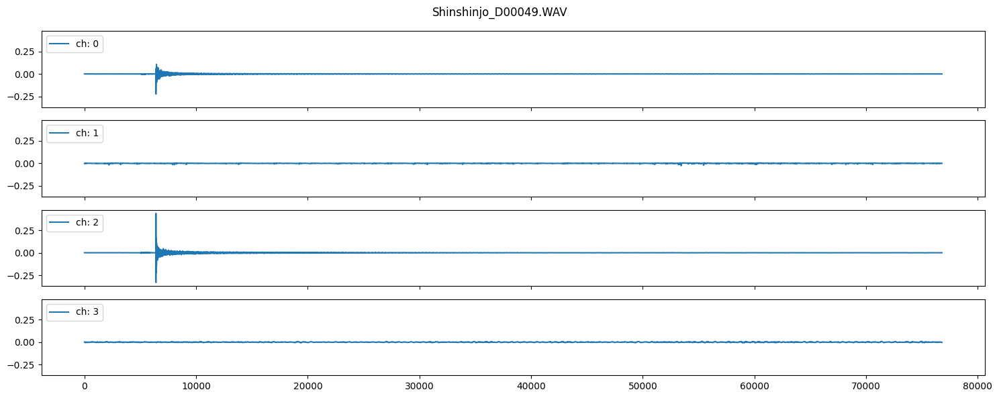

In [ ]:
# @title
amp_file.plot_df(df_orgin, selected_wav_file.value)

### 生データから使用チャンネルを選ぶ

In [ ]:
# @title
%%html
<div style="font-size: 20px; color: black; font-weight: bold; background-color: lightyellow; padding: 15px;">
使用チャンネルを選んでください
</div>

In [ ]:
# @title
# トグルボタンのオプション
options = [i for i in range(df_orgin.shape[1])]

select_channel = widgets.ToggleButtons(
    value=2,    # ここで指定すれば次からデフォルトになります
    options=options,
    description='採用Ch:',
    disabled=False,
    button_style='', # 'success', 'info', 'warning', 'danger' or ''
    style=dict(text_color='red'),
)

# トグルボタンを表示
display(select_channel)

ToggleButtons(description='採用Ch:', index=2, options=(0, 1, 2, 3), value=2)

In [ ]:
# @title
using_data = df_orgin.iloc[:, select_channel.value]  # 使用チャンネルのデータを取得

初期値設定

In [ ]:
# @title
limit_wav = len(using_data)
limit_y = abs(using_data[np.argmax(np.abs(using_data))])  # Find the value with the largest absolute value
sample_time = samplerate * 30    # 30sec

### データ範囲設定

In [ ]:
# @title
# スライダーのインスタンス作成
start_wav = widgets.IntSlider(value=1000, min=0, max=limit_wav-10, step=10, layout=widgets.Layout(width='100%'))
start_wav.style.handle_color='red'
x_limit = widgets.IntSlider(value=limit_wav, min=10, max=limit_wav, step=10, layout=widgets.Layout(width='100%'))
x_limit.style.handle_color='black'
y_limit = widgets.FloatSlider(value=limit_y, min=0.01, max=limit_y, step=0.01)
y_limit.style.handle_color='blue'

# 分析範囲の選定
@widgets.interact(start=start_wav, x_limit=x_limit, y_limit=y_limit)
def update_start(start: int, x_limit: int, y_limit: float):

    fig, ax = plt.subplots(figsize=(20, 4))

    ax.plot(using_data)
    ax.set_xlim(0, x_limit)
    ax.set_ylim(-y_limit, y_limit)
    ax.axvline(x=start, color='r', alpha=0.5)
    ax.axvline(x=start+sample_time, color='r', alpha=0.3)
    ax.axvspan(start, start+sample_time, color='r', alpha=0.1)

    plt.show()

interactive(children=(IntSlider(value=1000, description='start', layout=Layout(width='100%'), max=76790, step=…

In [ ]:
# @title
range_button = widgets.Button(description="範囲決定")
range_label = widgets.Label(value="範囲: 0")

def on_range_button_clicked(b):
    range_label.value = f"範囲: {start_wav.value} ～ {start_wav.value+sample_time}"


range_button.on_click(on_range_button_clicked)

widgets.HBox([range_button, range_label])

# display(range_button, range_label)

<Axes: >

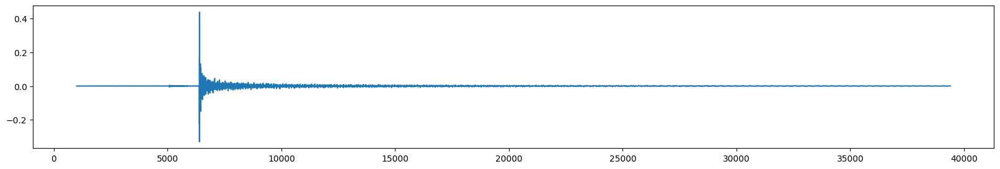

In [ ]:
# @title
ranged_wav = [start_wav.value, start_wav.value+sample_time]

# 選択範囲の表示
df_ranged_wav = using_data[ranged_wav[0]:ranged_wav[1]]
df_ranged_wav.plot(figsize=(20, 3))

### CSV ファイルの場合　未完

## ケーブル諸元入力画面

## 操作画面

In [ ]:
# @title
# グリッドのレイアウトを作成する関数
def create_grid(df):
    grid = []
    # ヘッダー行を作成
    # header = #[widgets.HTML(value="<b>id</b>", layout=widgets.Layout(width='50px'))] + \
    header = [widgets.HTML(value=f"<b>{col}</b>") for col in columns]
    grid.extend(header)

    # 各行を作成
    for i, row in df.iterrows():
        #grid.append(widgets.HTML(value=f"<b>{row['id']}</b>", layout=widgets.Layout(width='50px')))
        for col in columns:
            grid.append(row[col])

    return widgets.GridBox(grid, layout=widgets.Layout(grid_template_columns="repeat(4, 200px)"))
    # グリッドの最初の列（id列）の幅を50ピクセルに設定し、残りの4つの列の幅をそれぞれ200ピクセルに設定

# CSVファイルからデータを読み込む関数
def load_csv_to_form(file_path):
    csv_df = pd.read_csv(file_path)
    for i, row in csv_df.iterrows():
        for col in columns:
            df_input.at[i, col].value = str(row[col])  # ウィジェットにデータをセット

# 入力されたデータを取得する関数
def get_input_data() -> pd.DataFrame:
    input_data = {col: [widget.value for widget in df_input[col]] for col in columns}
    input_df = pd.DataFrame(input_data)
    #input_df['id'] = rows
    return input_df

def on_submit_button_clicked(b):
    with output:
        output.clear_output()
        input_df = get_input_data()
        display(input_df)
        # CSVファイルにデータを保存
        input_df.to_csv('/content/drive/MyDrive/FFT/cable_spec.csv', index=False)
        print("CSVファイルにデータを保存しました。")

# 列ラベル
columns = ['ケーブル番号', '単位重量', 'ケーブル長', '設計張力']

# 行ラベル（id）
rows = [i for i in range(10)]

# DataFrameの作成
# 入力セルの幅を180ピクセルに設定
data = {col: [widgets.Text(layout=widgets.Layout(width='180px')) for _ in rows] for col in columns}
#data['id'] = rows
df_input = pd.DataFrame(data)

# グリッドの表示
grid = create_grid(df_input)
display(grid)

# ボタンの作成と表示
submit_button = widgets.Button(description="Submit")
output = widgets.Output()

# イベント処理
submit_button.on_click(on_submit_button_clicked)
display(submit_button, output)

# CSVファイルを読み込んでフォームに反映
load_csv_to_form('/content/drive/MyDrive/FFT/cable_spec.csv')


GridBox(children=(HTML(value='<b>ケーブル番号</b>'), HTML(value='<b>単位重量</b>'), HTML(value='<b>ケーブル長</b>'), HTML(val…

Button(description='Submit', style=ButtonStyle())

Output()

In [ ]:
# @title
%%html
<div style="font-size: 20px; color: black; font-weight: bold; background-color: lightyellow; padding: 15px;">
ケーブル諸元のインデックスを選んでください
</div>

In [ ]:
# @title
print(f'振動データ：{selected_wav_file.value}')

振動データ：Shinshinjo_D00049.WAV


In [ ]:
# @title
select_cable = widgets.IntText(
    value=4,    # ここで指定すれば次からデフォルトになります
    description='インデックス:',
    style={'description_width': '140px'},
    disabled=False
)
display(select_cable)

IntText(value=4, description='インデックス:', style=DescriptionStyle(description_width='140px'))

In [ ]:
# @title
cable_index = select_cable.value

# 入力フォームより各変数を取得
cable_name = df_input.loc[cable_index, 'ケーブル番号'].value
unit_weight = float(df_input.loc[cable_index, '単位重量'].value)    # kg/m
cable_length = float(df_input.loc[cable_index, 'ケーブル長'].value)    # m
design_tension = float(df_input.loc[cable_index, '設計張力'].value) * 10**3    # 47.45 N

### UI各種設定

In [ ]:
# @title
# 窓の幅のデフォルト値を決めるために1次の振動数を得る
primary_frequency = GetNaturalFrequency(
        cable_name,
        unit_weight,
        cable_length,
        design_tension,
        max_mode=1
    ).get_natural_frequency_by_T()[0]

print(f'1次の振動数: {primary_frequency:.1f} Hz')

1次の振動数: 3.6 Hz


窓関数の幅, x軸の最大値を入力

In [ ]:
# @title
%%html
<div style="font-size: 20px; color: black; font-weight: bold; background-color: lightyellow; padding: 15px;">
各種設定値を入力してください
</div>

In [ ]:
# @title
# 窓関数の幅を入力
input_width = widgets.FloatText(
    value=round(primary_frequency*0.4, 1),    # 1次振動数の±40%
    step=0.1,
    min=0.1,
    description='窓の幅(Hz):',
    style={'description_width': '140px'},
    disabled=False
)

# 振動モードの最大値を入力
input_max_mode = widgets.IntText(
    value=7,    # 基本的には7次までとする
    description='最大次数:',
    style={'description_width': '140px'},
    disabled=False
)

# x軸の最大値を入力
freq_range = widgets.IntText(
    value=primary_frequency*15,
    description='表示最大周波数(Hz):',
    style={'description_width': '140px'},
    disabled=False
)

# ウィジェットの表示
display(input_width, input_max_mode, freq_range)

FloatText(value=1.4, description='窓の幅(Hz):', step=0.1, style=DescriptionStyle(description_width='140px'))

IntText(value=7, description='最大次数:', style=DescriptionStyle(description_width='140px'))

IntText(value=54, description='表示最大周波数(Hz):', style=DescriptionStyle(description_width='140px'))

スライダーのインスタンス作成

In [ ]:
# @title
# 張力分析範囲
updated_tension = widgets.FloatSlider(
    value=1.0,    # design_tension * 1.0
    min=0.1,
    max=3.0,
    step=0.01,
    description='張力更新:',
    layout=widgets.Layout(width='80%')
    )
updated_tension.style.handle_color='orange'

# EI分析範囲（GetNaturalFrequencyのインスタンス変数betaを可変とする）
updated_beta = widgets.FloatSlider(
    value=0.5,    # 仮のbeta：0.5
    min=0.1,
    max=5.0,    # 仮設定
    step=0.01,    # 仮設定
    description='beta更新:',
    layout=widgets.Layout(width='80%')
    )
updated_beta.style.handle_color='orange'

### 予備計算

インタラクティブな張力調整

In [ ]:
# @title
# global変数の定義
final_peaks: List[float] = []
base_frequencies: List[float] = []

# 採用次数の設定（暫定）
max_mode = input_max_mode.value

# 窓関数の幅
window_width = input_width.value

# x軸表示の最大値
freq_max = freq_range.value

# グラフタイトルの設定
graph_title = f'{cable_name} / {selected_wav_file.value}'

# インスタンス生成
temporary_natural_frequency = GetNaturalFrequency(
        cable_name,
        unit_weight,
        cable_length,
        design_tension,
        max_mode
    )

# 各基準周波数に対して窓内でピークを検出
filtered_frequencies, filtered_fft_result = fft(df_ranged_wav, samplerate)

In [ ]:
# @title
# ピークを検出し、結果を返す関数
def detect_peaks(updated_tension, updated_beta) -> list:
    # スライダーの値よりピークリストを得る

    global final_peaks
    global base_frequencies

    temporary_natural_frequency.beta = updated_beta

    base_frequencies = temporary_natural_frequency.get_natural_frequency_by_T(updated_tension)  # 顕著なピークを検出するための基準周波数リスト

    final_peaks = [find_peak_within_window(filtered_frequencies, filtered_fft_result, freq, window_width) for freq in base_frequencies]

    # グラフを描画
    plot_fft_and_mark_peaks(filtered_frequencies, filtered_fft_result, final_peaks, base_frequencies, graph_title, window_width, freq_max)

    # 検出されたピークのリストを表示
    final_peaks = [peak for peak in final_peaks if peak is not None]  # Noneを除外
    final_peaks.sort()  # リストをソート

    return final_peaks, base_frequencies

# インタラクティブウィジェットを使用して関数を実行
@widgets.interact(updated_tension=updated_tension, updated_beta=updated_beta)
def interact_function(updated_tension, updated_beta):
    peaks = detect_peaks(updated_tension, updated_beta)[0]

interactive(children=(FloatSlider(value=1.0, description='張力更新:', layout=Layout(width='80%'), max=3.0, min=0.1…

### 振動モードの次数を選択

In [ ]:
# @title
# トグルボタンクラスのインスタンスを作成して表示
toggle_switches = ToggleSwitches(max_mode)
toggle_switches.display()

# 現在の状態リストを取得
status_list = toggle_switches.get_status_list()
print(f"Initial mask list: {status_list}")


Current status list: [True, True, True, True, True, True, True]
Initial mask list: [True, True, True, True, True, True, True]
Current status list: [True, True, True, True, True, True, False]
Current status list: [True, True, True, True, True, True, True]
Current status list: [True, True, False, True, True, True, True]
Current status list: [True, True, False, True, False, True, True]
Current status list: [True, True, False, True, False, True, False]
Current status list: [True, True, True, True, False, True, False]
Current status list: [True, True, True, True, True, True, False]


In [ ]:
mask_list = toggle_switches.get_status_list()
mask_list

[True, True, True, True, True, True, False]

In [ ]:
base_frequencies, final_peaks

([3.729295534270278,
  7.5759975168608795,
  11.651598711076936,
  16.0569447861739,
  20.87939203944093,
  26.19192202884679,
  32.053790928332646],
 [3.933333333333333,
  7.8999999999999995,
  11.966666666666667,
  16.2,
  20.633333333333333,
  25.3,
  33.36666666666667])

In [ ]:
masked_base_frequencies, masked_final_peaks = masked_peaks(base_frequencies, final_peaks, mask_list)
masked_base_frequencies, masked_final_peaks

([3.729295534270278,
  7.5759975168608795,
  11.651598711076936,
  16.0569447861739,
  20.87939203944093,
  26.19192202884679],
 [3.933333333333333,
  7.8999999999999995,
  11.966666666666667,
  16.2,
  20.633333333333333,
  25.3])

### 収束計算（誤差が最小となる張力値のスキャニング）

- スライダーの位置を中心とした一定の範囲で，誤差が最小となる張力値を求める
- パラメータは張力Tおよびbeta

In [ ]:
# @title Scipy.optimize
# 目的関数の定義
def objective_function(vars):
    k, b = vars

    seq_1 = final_peaks
    seq_2 = temporary_natural_frequency.get_natural_frequency_by_T(k, b)

    masked_seq_1, masked_seq_2 = masked_peaks(seq_1, seq_2, mask_list)

    return calculate_rmse(masked_seq_1, masked_seq_2)

# 収束過程を記録するリスト
history = []

# カスタムコールバック関数の定義
def callback(vars):
    history.append(vars.copy())

# 変数の範囲制約
bounds = [(0.5, 1.5), (0.1, 5.5)]  # 例: 0.5 <= k <= 1.5, 0.1 <= b <= 2.5

# 初期推定値
initial_guess = [1.0, 0.5]

# 最適化の実行
result = minimize(objective_function, initial_guess, method='SLSQP', bounds=bounds, callback=callback)

# 結果の表示
print(f'Optimal value of t : {result.x[0] * design_tension:.0f}')
print(f'Optimal value of b : {result.x[1]:.2f}')
print(f'Optimal value of EI: {result.x[1] * temporary_natural_frequency._flexural_rigidity:.0f}')
print(f'Minimum value of RMSE: {result.fun}')

Optimal value of t : 459511
Optimal value of b : 1.14
Optimal value of EI: 88937
Minimum value of RMSE: 0.005901015088415311


## 結果の表示

■■ 次数と張力値の表示を適正化させる必要あり

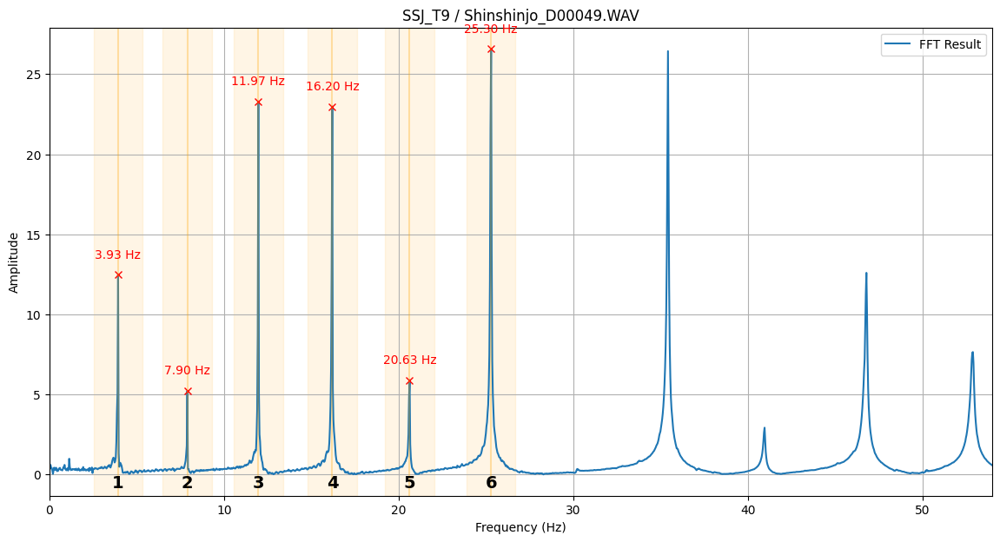

[3.9218415131947264,
 7.895938967025366,
 11.973408044774683,
 16.203185758494282,
 20.631176868792952,
 25.299636159059435,
 30.246801440319246]

In [ ]:
# @title
calculate_frequency = temporary_natural_frequency.get_natural_frequency_by_T(result.x[0], result.x[1])

# マスク処理
masked_final_peaks, masked_calculate_frequency = masked_peaks(masked_final_peaks, calculate_frequency, mask_list)

# グラフを描画
plot_fft_and_mark_peaks(filtered_frequencies, filtered_fft_result, masked_final_peaks, masked_calculate_frequency, graph_title, window_width, freq_max)
calculate_frequency

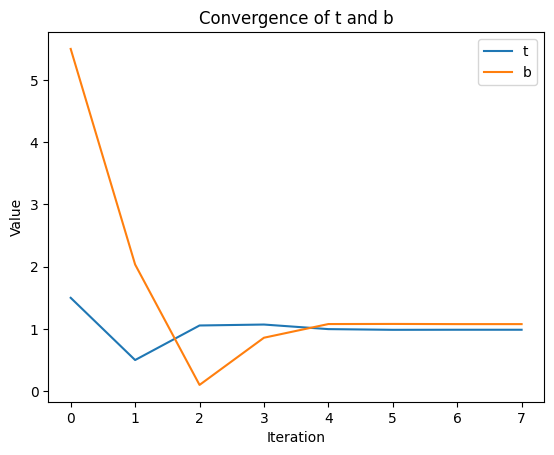

In [ ]:
# 収束過程のプロット
history = np.array(history)
plt.plot(history[:, 0], label='t')
plt.plot(history[:, 1], label='b')
plt.xlabel('Iteration')
plt.ylabel('Value')
plt.title('Convergence of t and b')
plt.legend()
plt.show()

# END

In [ ]:
# 必要なライブラリをインストール
!pip install plotly

■■ なんか変？

In [ ]:
import plotly.graph_objects as go
import numpy as np

# t_range, b_rangeの設定
t_range = np.linspace(0.1, 2.5, 500)
b_range = np.linspace(0.5, 1.5, 500)
rmse_values = np.zeros((len(t_range), len(b_range)))

# RMSE値の計算
for i, t in enumerate(t_range):
    for j, b in enumerate(b_range):
        seq_1 = final_peaks
        seq_2 = temporary_natural_frequency.get_natural_frequency_by_T(t, b)
        masked_seq_1, masked_seq_2 = masked_peaks(seq_1, seq_2, mask_list)
        rmse_values[i, j] = calculate_rmse(masked_seq_1, masked_seq_2)

# メッシュグリッドの作成
X, Y = np.meshgrid(t_range, b_range)

# 3Dプロットの作成
fig = go.Figure(data=[go.Surface(z=rmse_values, x=X, y=Y, colorscale='Viridis', opacity=0.3)])

# レイアウトの設定
fig.update_layout(
    title='3D Surface Plot',
    scene=dict(
        xaxis_title='t',
        yaxis_title='b',
        zaxis_title='RMSE',
        zaxis=dict(range=[0, 2])
    ),
    autosize=False,
    width=800,
    height=800,
    margin=dict(l=65, r=50, b=65, t=90)
)

# グラフの表示
fig.show()


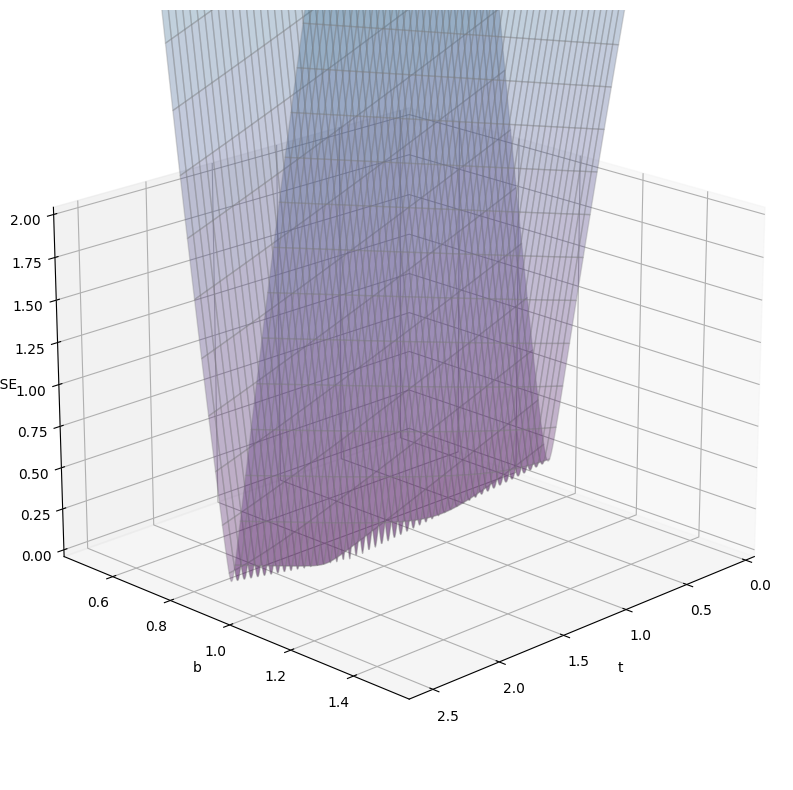

In [ ]:
t_range = np.linspace(0.1, 2.5, 500)
b_range = np.linspace(0.5, 1.5, 500)
rmse_values = np.zeros((len(t_range), len(b_range)))

for i, t in enumerate(t_range):
    for j, b in enumerate(b_range):
        seq_1 = final_peaks
        seq_2 = temporary_natural_frequency.get_natural_frequency_by_T(t, b)
        masked_seq_1, masked_seq_2 = masked_peaks(seq_1, seq_2, mask_list)
        rmse_values[i, j] = calculate_rmse(masked_seq_1, masked_seq_2)

fig, ax = plt.subplots(figsize=(10, 10), subplot_kw={"projection": "3d"})
X, Y = np.meshgrid(t_range, b_range)
ax.plot_surface(X, Y, rmse_values, cmap='viridis', alpha=0.3, edgecolor='gray')

# 視点の設定（仰角と方位角）
ax.view_init(elev=20, azim=45)  # elev: 仰角、azim: 方位角

ax.set_xlabel('t')
ax.set_ylabel('b')
ax.set_zlabel('RMSE')
ax.set_zlim(0, 2)
plt.show()

張力: 55144 N  
RMSE: 0.03762812217163309

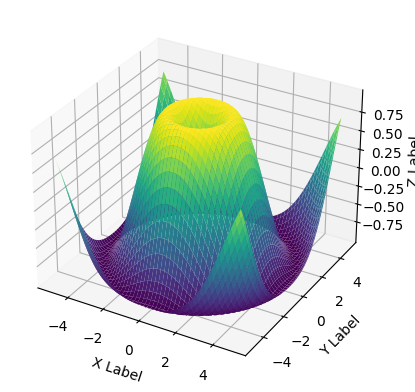

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# データの生成
x = np.linspace(-5, 5, 100)
y = np.linspace(-5, 5, 100)
x, y = np.meshgrid(x, y)
z = np.sin(np.sqrt(x**2 + y**2))

# 3Dプロットの作成
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# 曲面の描画
ax.plot_surface(x, y, z, cmap='viridis')

# ラベルの設定
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

plt.show()
